# Differentially expressed gene analysis on boundaries

In [1]:
#load packages
library(Seurat)
library(ggplot2)
library(magrittr)
library(data.table)
library(Matrix)
library(dplyr)
library(tibble)
library(MAST)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
 

In [2]:
#load data
seu_PR <- readRDS(file = "../../data/seurat_object/Set3/seu_lateralect_PR_ID.obj")

In [3]:
seu_PR

An object of class Seurat 
28745 features across 1717 samples within 2 assays 
Active assay: SCT (11239 features, 2000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, reumap

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


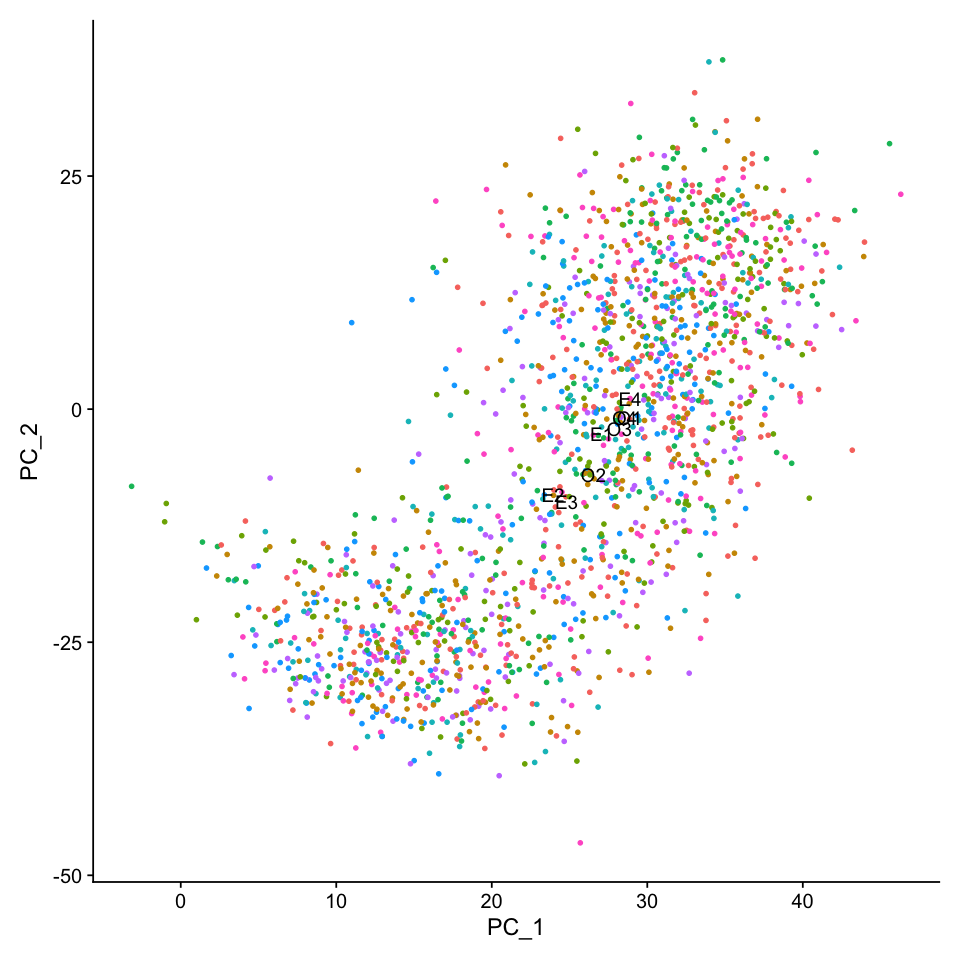

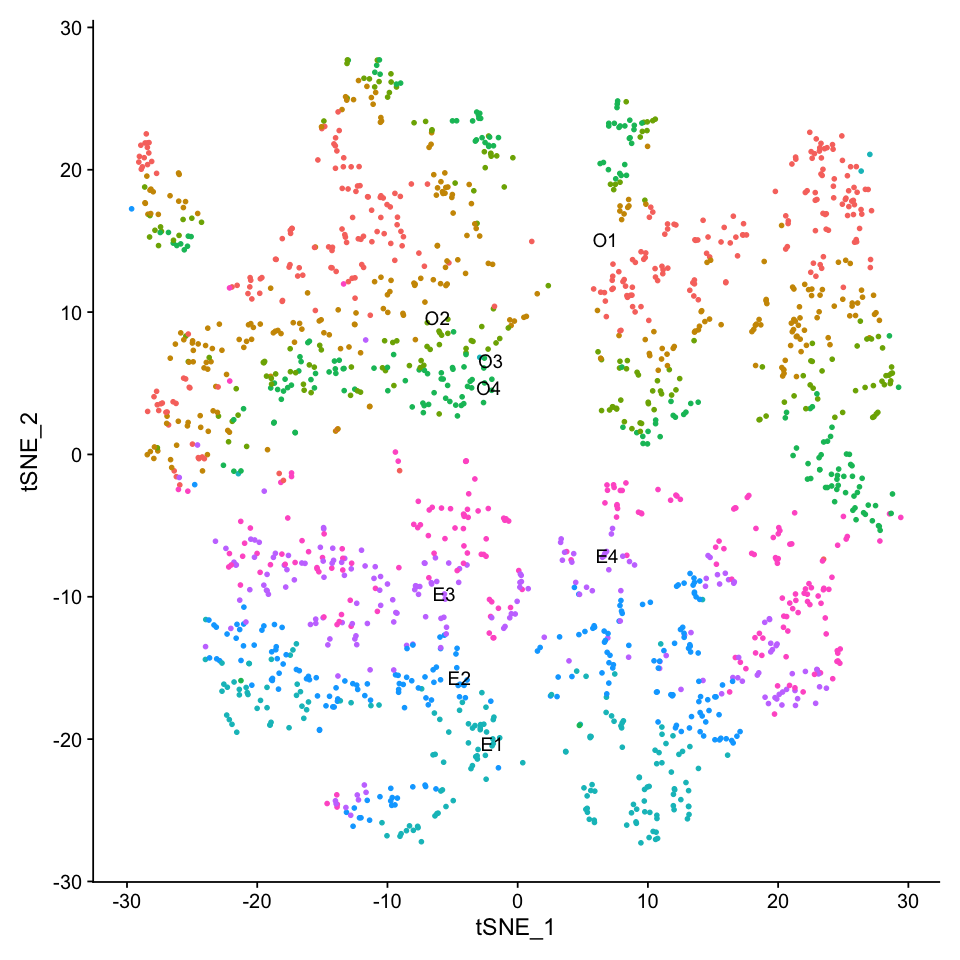

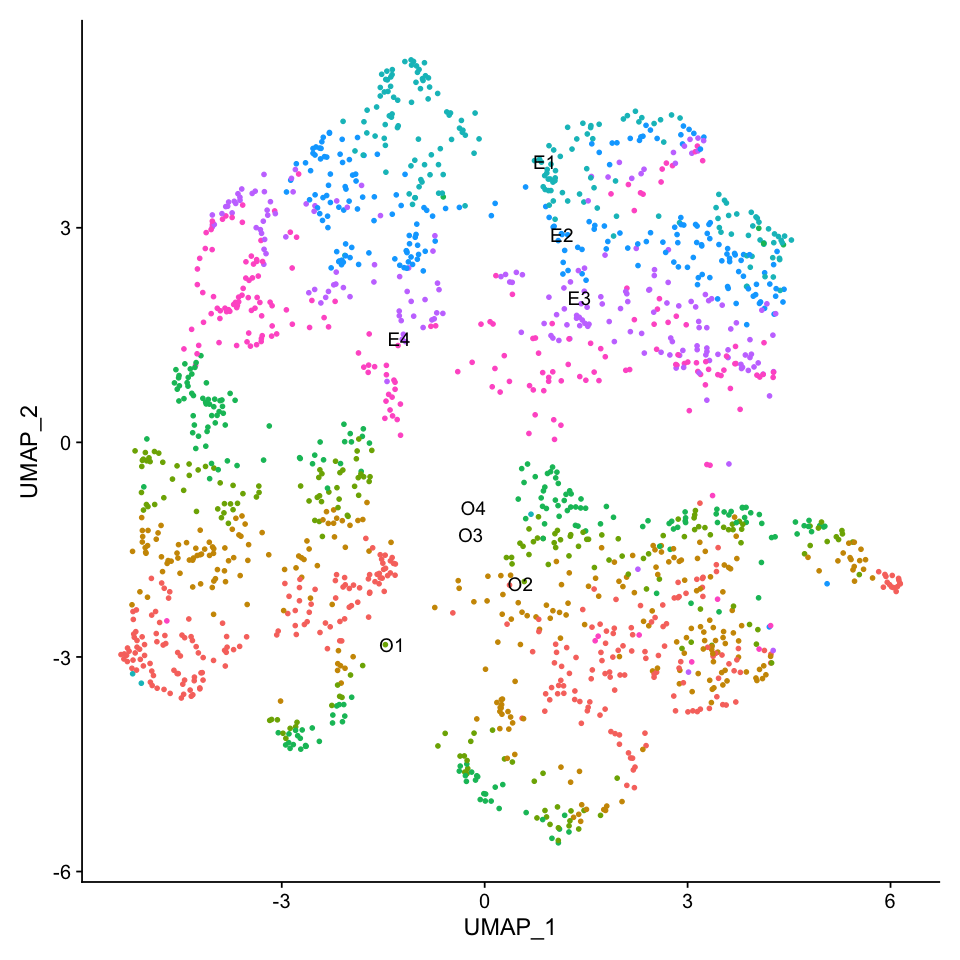

In [4]:
options(repr.plot.width=8, repr.plot.height=8)
seu_PR <- RunPCA(seu_PR, verbose = FALSE)
seu_PR <- RunTSNE(seu_PR, dims = 1:30, verbose = FALSE)
seu_PR <- RunUMAP(seu_PR, dims = 1:30, verbose = FALSE)
DimPlot(seu_PR, reduction =  "pca", label = TRUE) + NoLegend()
DimPlot(seu_PR, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_PR, reduction =  "umap", label = TRUE) + NoLegend()

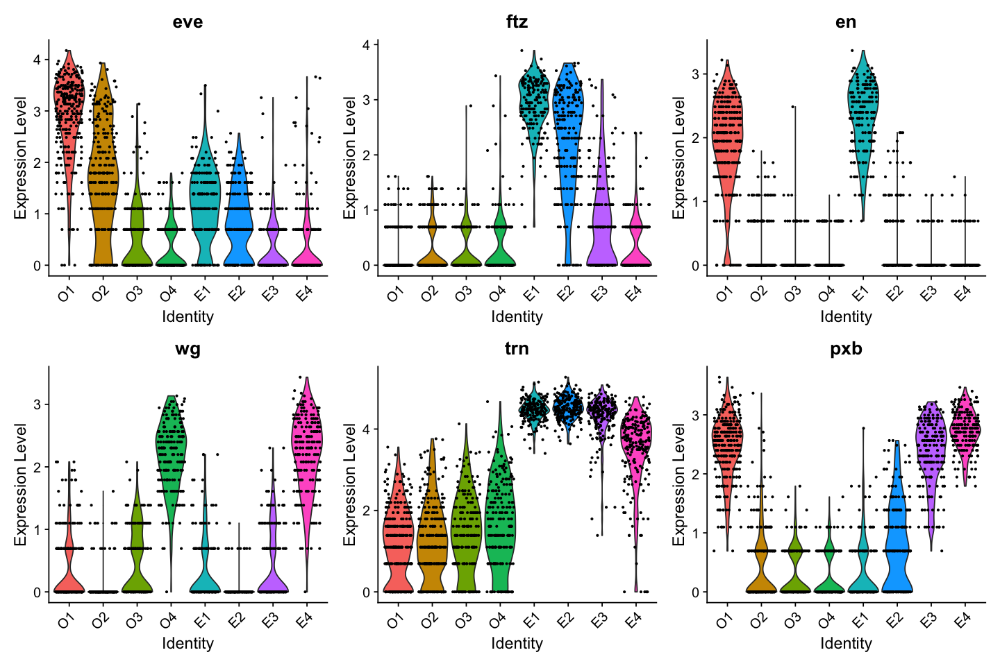

In [5]:
options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seu_PR, features = c("eve", "ftz", "en", "wg", "trn", "pxb"),  pt.size = 0.5) 

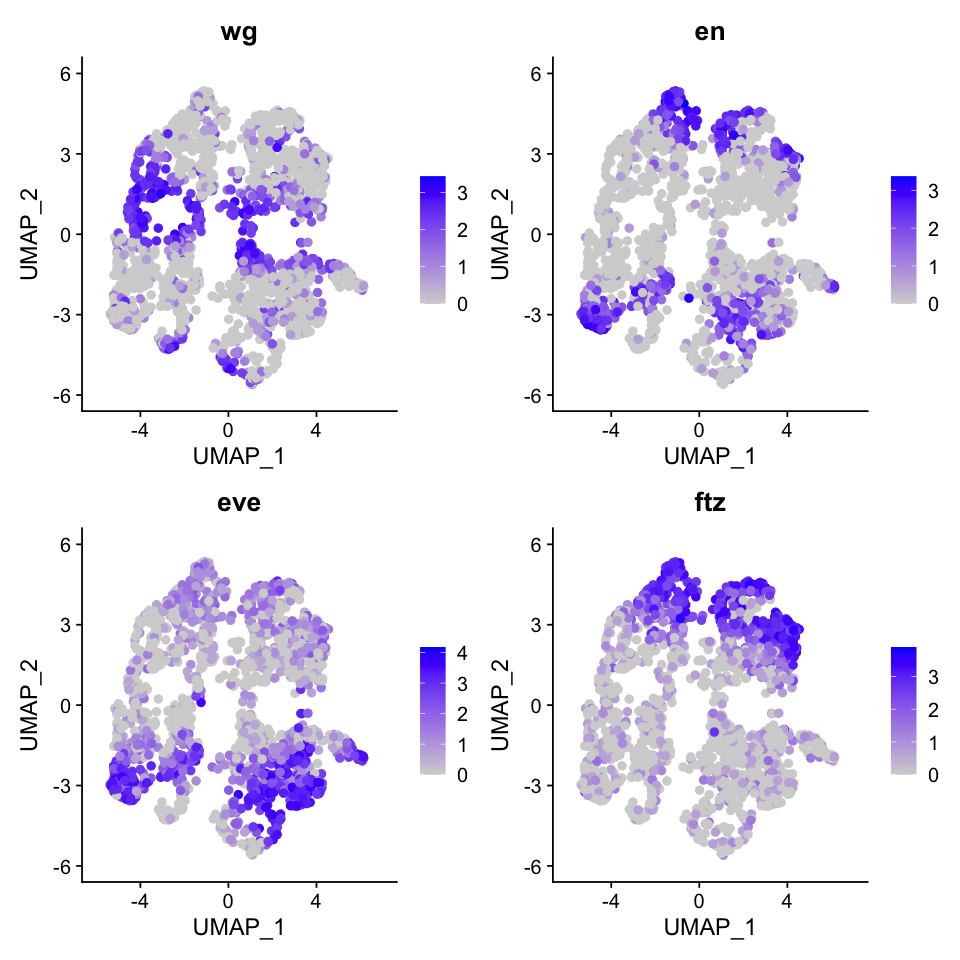

In [6]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_PR, reduction = "umap", features = c("wg", "en", "eve", "ftz"), pt.size = 2,  ncol = 2)

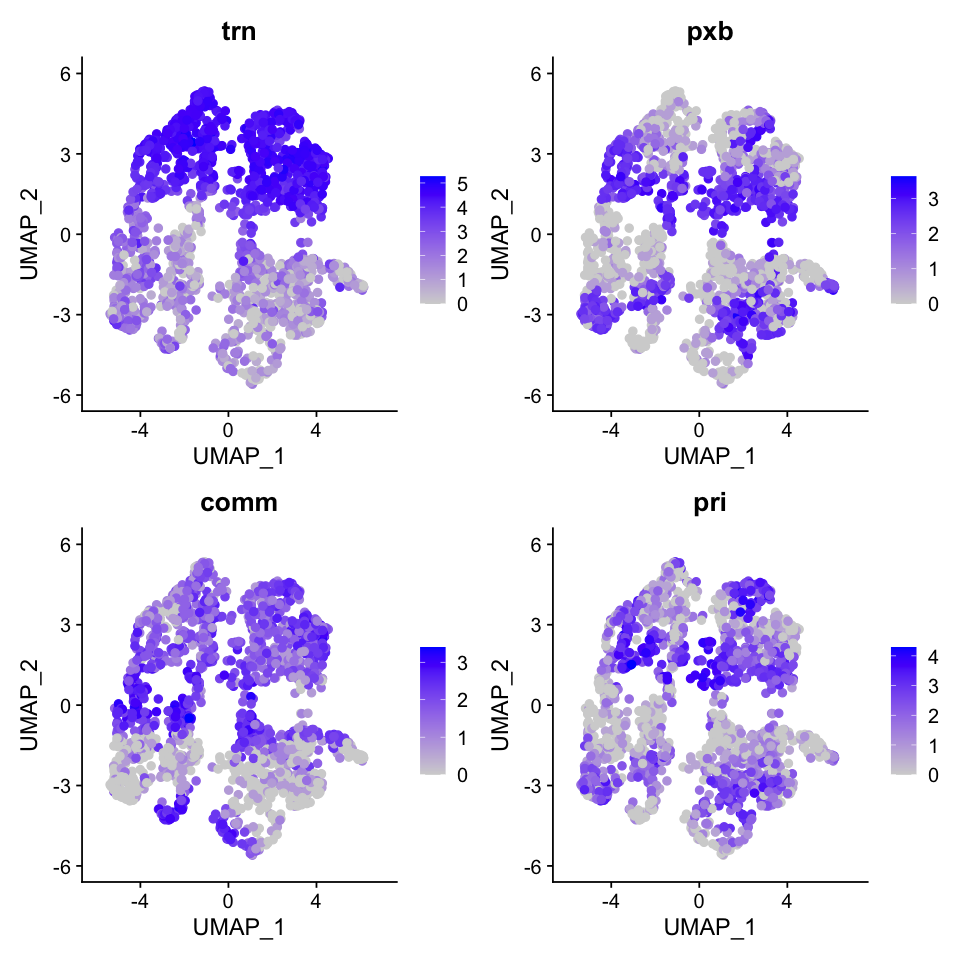

In [7]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_PR, reduction = "umap", features = c("trn", "pxb", "comm", "pri"), pt.size = 2,  ncol = 2)

## DEG analysis

In [8]:
Idents(seu_PR) <- "pairrule_ID"

In [9]:
levels <- c("O1","O2","O3","O4", "E1","E2","E3","E4")
levels(seu_PR) <- levels

In [10]:
seu_PR_VF3000 <- seu_PR[VariableFeatures(seu_PR), ]
seu_PR_VF3000

An object of class Seurat 
4000 features across 1717 samples within 2 assays 
Active assay: SCT (2000 features, 2000 variable features)
 1 other assay present: RNA
 4 dimensional reductions calculated: pca, umap, reumap, tsne

### O1 vs. O2


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
pxb,8.620496e-140,1.8718022,1.000,0.402,1.724099e-136,O1vsO2
hh,2.761928e-139,1.9208552,0.996,0.203,5.523855e-136,O1vsO2
en,1.697168e-109,1.8206127,0.944,0.199,3.394336e-106,O1vsO2
odd,2.871062e-95,-1.3606561,0.411,0.973,5.742124e-92,O1vsO2
gsb,2.603967e-77,2.2400056,0.814,0.123,5.207934e-74,O1vsO2
drm,1.004479e-68,-1.0551370,0.309,0.916,2.008959e-65,O1vsO2
sob,2.139033e-58,-0.9805319,0.298,0.889,4.278066e-55,O1vsO2
prd,1.411991e-49,1.2843001,0.775,0.226,2.823983e-46,O1vsO2
eve,1.744020e-42,0.9048521,0.989,0.835,3.488039e-39,O1vsO2


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
pxb,8.620496e-140,1.8718022,1.000,0.402,1.724099e-136
hh,2.761928e-139,1.9208552,0.996,0.203,5.523855e-136
en,1.697168e-109,1.8206127,0.944,0.199,3.394336e-106
gsb,2.603967e-77,2.2400056,0.814,0.123,5.207934e-74
prd,1.411991e-49,1.2843001,0.775,0.226,2.823983e-46
eve,1.744020e-42,0.9048521,0.989,0.835,3.488039e-39
pri,1.946634e-25,0.8524670,0.909,0.605,3.893268e-22
sc,2.535765e-24,0.9803198,0.382,0.054,5.071529e-21
ac,1.462425e-16,0.8853233,0.319,0.069,2.924849e-13


[1] 9 5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
odd,2.871062e-95,-1.3606561,0.411,0.973,5.742124e-92
drm,1.004479e-68,-1.0551370,0.309,0.916,2.008959e-65
sob,2.139033e-58,-0.9805319,0.298,0.889,4.278066e-55
run,1.762196e-28,-0.7920318,0.302,0.713,3.524392e-25
upd1,1.483962e-21,-0.7992983,0.084,0.410,2.967925e-18
toc,8.254033e-16,-0.7977997,0.404,0.724,1.650807e-12


[1] 6 5

[1] "DEGs O1vsO2, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs O1vsO2, avgFC <= -1.5, FWER <= 0.01"

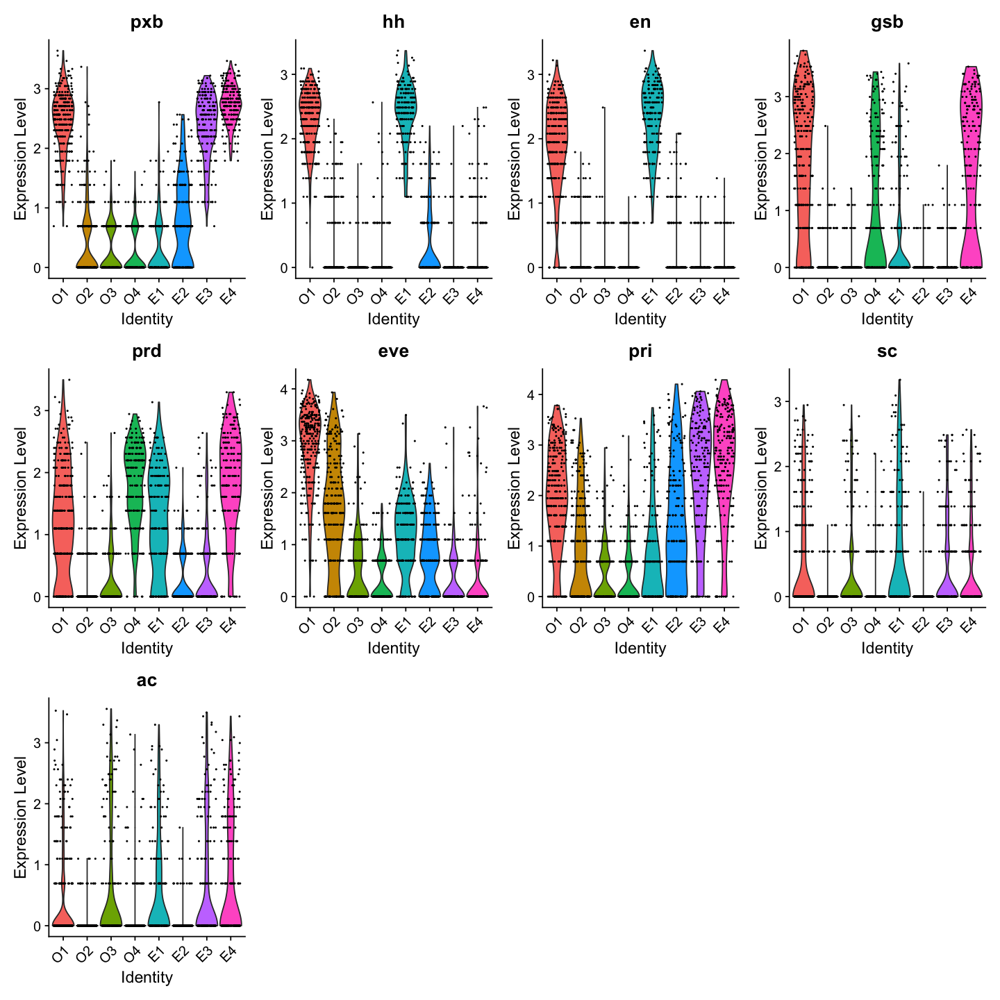

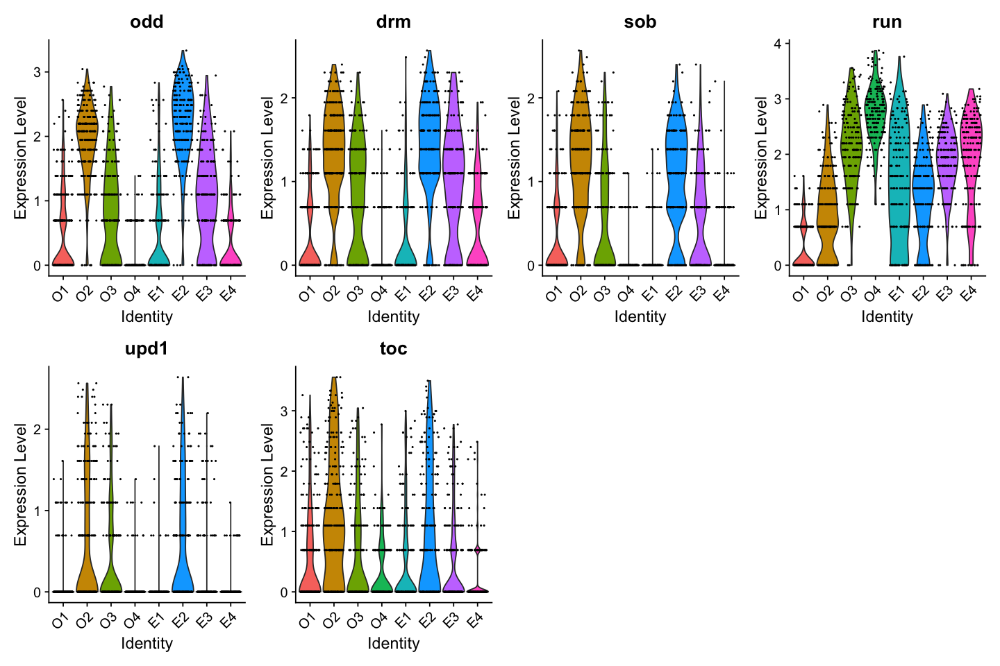

In [11]:
DE_O1vsO2 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "O1",
  ident.2 = "O2",
  logfc.threshold = log(2.0),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_O1vsO2_FWER0.01_FC2.0 <- filter(DE_O1vsO2, p_val_adj <= 0.01)

compaired_ID <- rep("O1vsO2", length=nrow(DE_O1vsO2_FWER0.01_FC2.0)) 
DE_O1vsO2_FWER0.01_FC2.0 <- cbind(DE_O1vsO2_FWER0.01_FC2.0, compaired_ID)
DE_O1vsO2_FWER0.01_FC2.0

DE_O1vsO2_FWER0.01_FC2.0_plus <- filter(DE_O1vsO2, p_val_adj <= 0.01 & avg_logFC >= log(2.0) )
DE_O1vsO2_FWER0.01_FC2.0_plus
dim(DE_O1vsO2_FWER0.01_FC2.0_plus)
DE_O1vsO2_FWER0.01_FC2.0_minus <- filter(DE_O1vsO2, p_val_adj <= 0.01 & avg_logFC <= -log(2.0) )
DE_O1vsO2_FWER0.01_FC2.0_minus
dim(DE_O1vsO2_FWER0.01_FC2.0_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_O1vsO2_FWER0.01_FC2.0_plus)/4))
"DEGs O1vsO2, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O1vsO2_FWER0.01_FC2.0_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_O1vsO2_plus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O1vsO2_FWER0.01_FC2.0_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_O1vsO2_FWER0.01_FC2.0_minus)/4))
"DEGs O1vsO2, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O1vsO2_FWER0.01_FC2.0_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_O1vsO2_minus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O1vsO2_FWER0.01_FC2.0_minus)/4))

write.table(DE_O1vsO2_FWER0.01_FC2.0, file = "./DEG_boundary_FC2.0/DEGs_O1vsO2_FWER0.01_FC2.0.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)

### O2 vs. O3


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
mid,4.189262e-92,1.8692039,0.973,0.328,8.378524e-89,O2vsO3
slp1,6.638716e-87,-1.8903968,0.375,0.979,1.327743e-83,O2vsO3
comm,1.532954e-64,-1.5386427,0.406,0.937,3.065909e-61,O2vsO3
Tollo,1.008043e-60,0.9751762,1.000,0.963,2.016087e-57,O2vsO3
run,3.495899e-54,-1.2039556,0.713,0.989,6.991798e-51,O2vsO3
comm2,4.033610e-52,-1.0828601,0.157,0.804,8.067220e-49,O2vsO3
odd,7.246924e-49,0.9241615,0.973,0.640,1.449385e-45,O2vsO3
eve,3.114983e-31,1.3631948,0.835,0.455,6.229965e-28,O2vsO3
h,1.282656e-19,0.7781194,0.705,0.323,2.565312e-16,O2vsO3


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
mid,4.189262e-92,1.8692039,0.973,0.328,8.378524e-89
Tollo,1.008043e-60,0.9751762,1.000,0.963,2.016087e-57
odd,7.246924e-49,0.9241615,0.973,0.640,1.449385e-45
eve,3.114983e-31,1.3631948,0.835,0.455,6.229965e-28
h,1.282656e-19,0.7781194,0.705,0.323,2.565312e-16
pri,1.717540e-10,0.7959907,0.605,0.455,3.435081e-07
l(1)sc,1.356976e-08,0.7769475,0.770,0.598,2.713951e-05


[1] 7 5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
slp1,6.638716e-87,-1.8903968,0.375,0.979,1.327743e-83
comm,1.532954e-64,-1.5386427,0.406,0.937,3.065909e-61
run,3.495899e-54,-1.2039556,0.713,0.989,6.991798e-51
comm2,4.033610e-52,-1.0828601,0.157,0.804,8.067220e-49
ac,6.827090e-17,-1.2212383,0.069,0.333,1.365418e-13
18w,1.262016e-16,-0.8090236,0.575,0.831,2.524032e-13
sc,1.918319e-12,-0.7737805,0.054,0.280,3.836639e-09


[1] 7 5

[1] "DEGs O2vsO3, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs O2vsO3, avgFC <= -1.5, FWER <= 0.01"

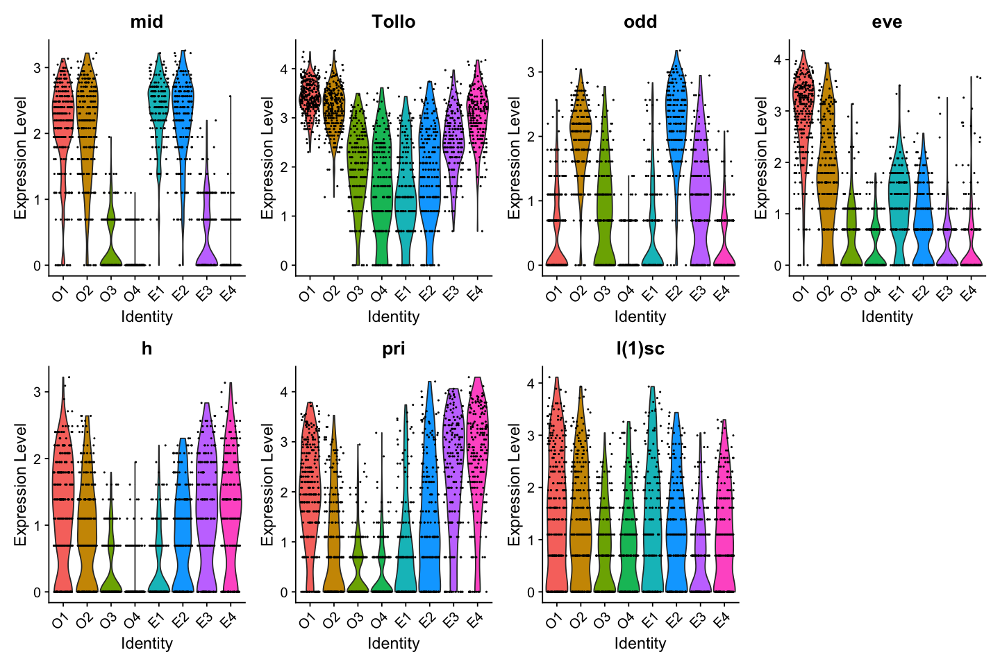

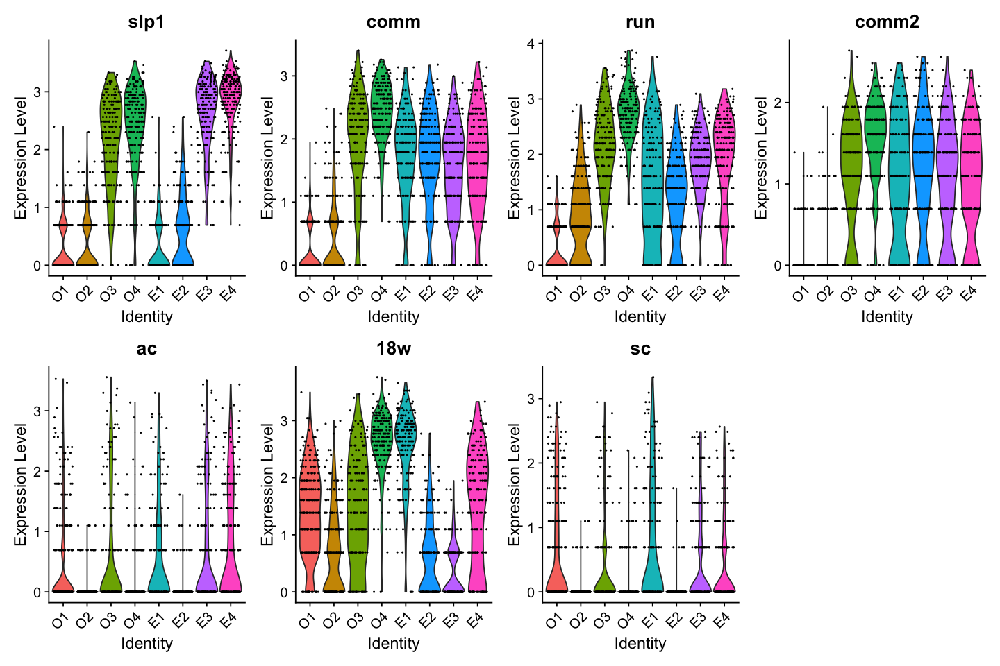

In [12]:
DE_O2vsO3 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "O2",
  ident.2 = "O3",
  logfc.threshold = log(2.0),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_O2vsO3_FWER0.01_FC2.0 <- filter(DE_O2vsO3, p_val_adj <= 0.01)

compaired_ID <- rep("O2vsO3", length=nrow(DE_O2vsO3_FWER0.01_FC2.0)) 
DE_O2vsO3_FWER0.01_FC2.0 <- cbind(DE_O2vsO3_FWER0.01_FC2.0, compaired_ID)
DE_O2vsO3_FWER0.01_FC2.0

DE_O2vsO3_FWER0.01_FC2.0_plus <- filter(DE_O2vsO3, p_val_adj <= 0.01 & avg_logFC >= log(2.0) )
DE_O2vsO3_FWER0.01_FC2.0_plus
dim(DE_O2vsO3_FWER0.01_FC2.0_plus)
DE_O2vsO3_FWER0.01_FC2.0_minus <- filter(DE_O2vsO3, p_val_adj <= 0.01 & avg_logFC <= -log(2.0) )
DE_O2vsO3_FWER0.01_FC2.0_minus
dim(DE_O2vsO3_FWER0.01_FC2.0_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_O2vsO3_FWER0.01_FC2.0_plus)/4))
"DEGs O2vsO3, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O2vsO3_FWER0.01_FC2.0_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_O2vsO3_plus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O2vsO3_FWER0.01_FC2.0_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_O2vsO3_FWER0.01_FC2.0_minus)/4))
"DEGs O2vsO3, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O2vsO3_FWER0.01_FC2.0_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_O2vsO3_minus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O2vsO3_FWER0.01_FC2.0_minus)/4))

write.table(DE_O2vsO3_FWER0.01_FC2.0, file = "./DEG_boundary_FC2.0/DEGs_O2vsO3_FWER0.01_FC2.0.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)





### O3 vs. O4


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
wg,3.002595e-93,-1.6936622,0.460,0.995,6.005191e-90,O3vsO4
prd,4.597258e-68,-1.5243313,0.280,0.966,9.194517e-65,O3vsO4
18w,4.247344e-41,-0.8939046,0.831,0.985,8.494688e-38,O3vsO4
gsb,3.950160e-29,-1.7263327,0.085,0.554,7.900320e-26,O3vsO4
odd,1.217819e-23,0.8996675,0.640,0.230,2.435639e-20,O3vsO4
drm,1.091017e-22,0.7310539,0.640,0.201,2.182035e-19,O3vsO4
ac,3.607649e-06,0.8002019,0.333,0.176,7.215298e-03,O3vsO4


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
odd,1.217819e-23,0.8996675,0.640,0.230,2.435639e-20
drm,1.091017e-22,0.7310539,0.640,0.201,2.182035e-19
ac,3.607649e-06,0.8002019,0.333,0.176,7.215298e-03


[1] 3 5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
wg,3.002595e-93,-1.6936622,0.460,0.995,6.005191e-90
prd,4.597258e-68,-1.5243313,0.280,0.966,9.194517e-65
18w,4.247344e-41,-0.8939046,0.831,0.985,8.494688e-38
gsb,3.950160e-29,-1.7263327,0.085,0.554,7.900320e-26


[1] 4 5

[1] "DEGs O3vsO4, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs O3vsO4, avgFC <= -1.5, FWER <= 0.01"

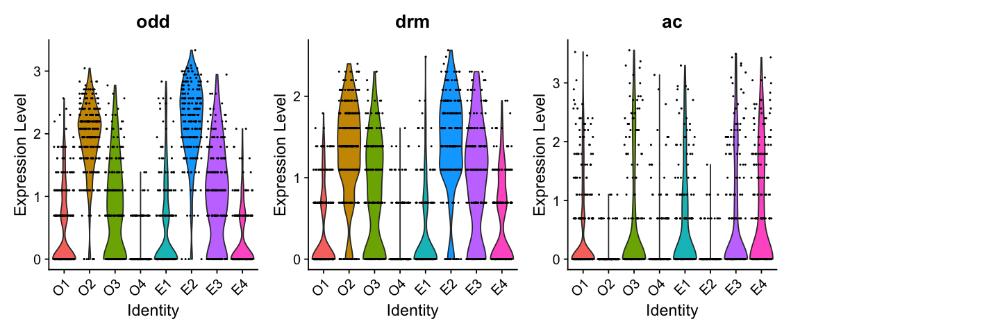

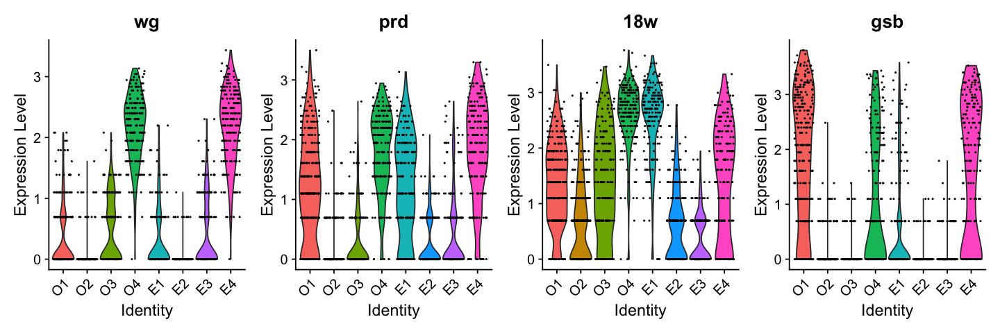

In [13]:
DE_O3vsO4 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "O3",
  ident.2 = "O4",
  logfc.threshold = log(2.0),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_O3vsO4_FWER0.01_FC2.0 <- filter(DE_O3vsO4, p_val_adj <= 0.01)

compaired_ID <- rep("O3vsO4", length=nrow(DE_O3vsO4_FWER0.01_FC2.0)) 
DE_O3vsO4_FWER0.01_FC2.0 <- cbind(DE_O3vsO4_FWER0.01_FC2.0, compaired_ID)
DE_O3vsO4_FWER0.01_FC2.0

DE_O3vsO4_FWER0.01_FC2.0_plus <- filter(DE_O3vsO4, p_val_adj <= 0.01 & avg_logFC >= log(2.0) )
DE_O3vsO4_FWER0.01_FC2.0_plus
dim(DE_O3vsO4_FWER0.01_FC2.0_plus)
DE_O3vsO4_FWER0.01_FC2.0_minus <- filter(DE_O3vsO4, p_val_adj <= 0.01 & avg_logFC <= -log(2.0) )
DE_O3vsO4_FWER0.01_FC2.0_minus
dim(DE_O3vsO4_FWER0.01_FC2.0_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_O3vsO4_FWER0.01_FC2.0_plus)/4))
"DEGs O3vsO4, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O3vsO4_FWER0.01_FC2.0_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_O3vsO4_plus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O3vsO4_FWER0.01_FC2.0_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_O3vsO4_FWER0.01_FC2.0_minus)/4))
"DEGs O3vsO4, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O3vsO4_FWER0.01_FC2.0_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_O3vsO4_minus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O3vsO4_FWER0.01_FC2.0_minus)/4))

write.table(DE_O3vsO4_FWER0.01_FC2.0, file = "./DEG_boundary_FC2.0/DEGs_O3vsO4_FWER0.01_FC2.0.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)


### O4 vs. E1


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
trn,1.199747e-127,-2.2536809,0.877,1.000,2.399495e-124,O4vsE1
ftz,3.911958e-123,-2.4214492,0.338,1.000,7.823916e-120,O4vsE1
mid,6.170515e-121,-2.2825225,0.176,0.994,1.234103e-117,O4vsE1
en,1.849716e-113,-2.3207477,0.127,1.000,3.699431e-110,O4vsE1
hh,2.733602e-106,-2.1910646,0.142,1.000,5.467205e-103,O4vsE1
slp1,2.054383e-91,2.1339860,0.975,0.328,4.108765e-88,O4vsE1
wg,2.304852e-89,1.8132560,0.995,0.294,4.609705e-86,O4vsE1
Toll-6,8.782229e-72,1.9469813,0.961,0.712,1.756446e-68,O4vsE1
run,2.325482e-45,0.9549355,1.000,0.808,4.650964e-42,O4vsE1


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
slp1,2.054383e-91,2.1339860,0.975,0.328,4.108765e-88
wg,2.304852e-89,1.8132560,0.995,0.294,4.609705e-86
Toll-6,8.782229e-72,1.9469813,0.961,0.712,1.756446e-68
run,2.325482e-45,0.9549355,1.000,0.808,4.650964e-42
slp2,1.994602e-37,0.9004169,0.642,0.051,3.989205e-34
ich,6.462788e-27,1.2632079,0.853,0.525,1.292558e-23
ImpL2,9.289961e-19,0.8402441,0.990,0.966,1.857992e-15
Abd-B,3.011466e-13,2.1387699,0.294,0.090,6.022932e-10


[1] 8 5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
trn,1.199747e-127,-2.2536809,0.877,1.000,2.399495e-124
ftz,3.911958e-123,-2.4214492,0.338,1.000,7.823916e-120
mid,6.170515e-121,-2.2825225,0.176,0.994,1.234103e-117
en,1.849716e-113,-2.3207477,0.127,1.000,3.699431e-110
hh,2.733602e-106,-2.1910646,0.142,1.000,5.467205e-103
eve,8.664011e-32,-0.9897103,0.377,0.853,1.732802e-28
CG4702,2.635259e-22,-1.2931199,0.152,0.554,5.270518e-19
5-HT2A,1.601685e-17,-0.7292494,0.554,0.774,3.203370e-14
CG10479,6.123821e-13,-0.7159048,0.593,0.825,1.224764e-09


[1] 11  5

[1] "DEGs O4vsE1, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs O4vsE1, avgFC <= -1.5, FWER <= 0.01"

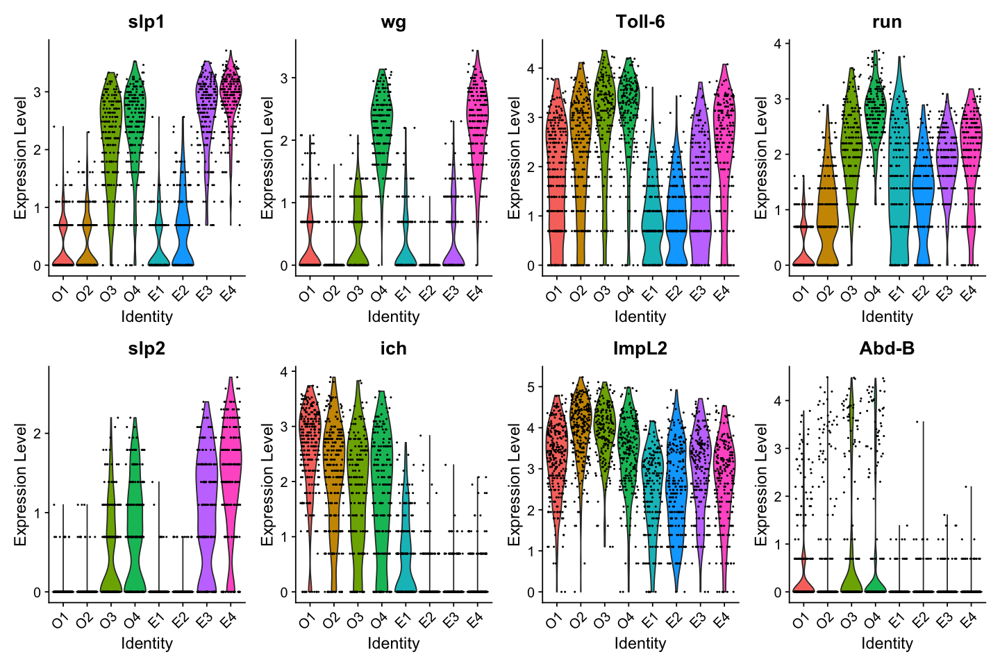

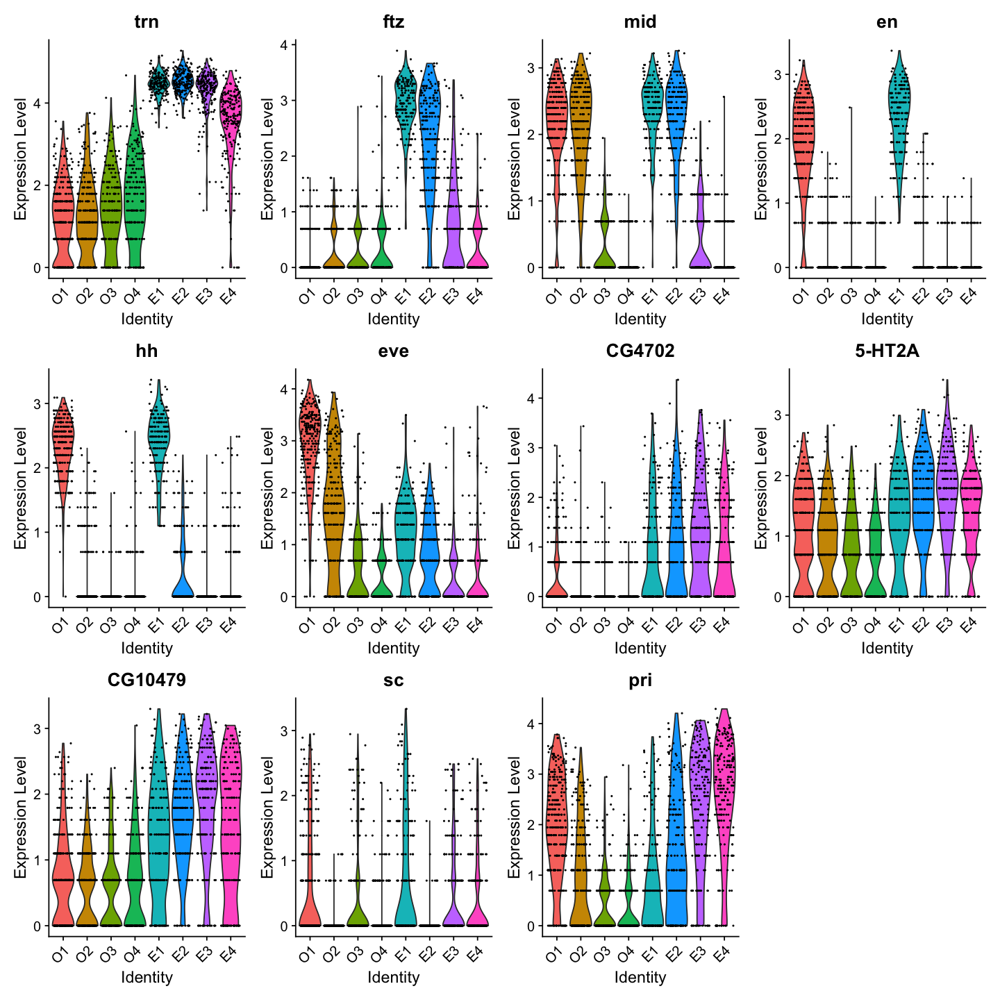

In [14]:
DE_O4vsE1 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "O4",
  ident.2 = "E1",
  logfc.threshold = log(2.0),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_O4vsE1_FWER0.01_FC2.0 <- filter(DE_O4vsE1, p_val_adj <= 0.01)

compaired_ID <- rep("O4vsE1", length=nrow(DE_O4vsE1_FWER0.01_FC2.0)) 
DE_O4vsE1_FWER0.01_FC2.0 <- cbind(DE_O4vsE1_FWER0.01_FC2.0, compaired_ID)
DE_O4vsE1_FWER0.01_FC2.0

DE_O4vsE1_FWER0.01_FC2.0_plus <- filter(DE_O4vsE1, p_val_adj <= 0.01 & avg_logFC >= log(2.0) )
DE_O4vsE1_FWER0.01_FC2.0_plus
dim(DE_O4vsE1_FWER0.01_FC2.0_plus)
DE_O4vsE1_FWER0.01_FC2.0_minus <- filter(DE_O4vsE1, p_val_adj <= 0.01 & avg_logFC <= -log(2.0) )
DE_O4vsE1_FWER0.01_FC2.0_minus
dim(DE_O4vsE1_FWER0.01_FC2.0_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_O4vsE1_FWER0.01_FC2.0_plus)/4))
"DEGs O4vsE1, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O4vsE1_FWER0.01_FC2.0_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_O4vsE1_plus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O4vsE1_FWER0.01_FC2.0_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_O4vsE1_FWER0.01_FC2.0_minus)/4))
"DEGs O4vsE1, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_O4vsE1_FWER0.01_FC2.0_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_O4vsE1_minus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_O4vsE1_FWER0.01_FC2.0_minus)/4))

write.table(DE_O4vsE1_FWER0.01_FC2.0, file = "./DEG_boundary_FC2.0/DEGs_O4vsE1_FWER0.01_FC2.0.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)


### E1 vs. E2


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
hh,2.750383e-102,1.9717408,1.000,0.310,5.500766e-99,E1vsE2
en,3.261415e-93,1.9836999,1.000,0.241,6.522829e-90,E1vsE2
18w,7.884658e-81,1.7874755,0.977,0.567,1.576932e-77,E1vsE2
odd,6.505092e-67,-1.4984804,0.412,0.980,1.301018e-63,E1vsE2
drm,2.946231e-51,-1.1238951,0.277,0.921,5.892463e-48,E1vsE2
sob,1.296233e-46,-1.0303331,0.119,0.803,2.592466e-43,E1vsE2
prd,5.063563e-34,1.1791164,0.791,0.296,1.012713e-30,E1vsE2
sc,3.992907e-23,1.2137241,0.441,0.039,7.985815e-20,E1vsE2
dpn,2.717135e-22,-0.9081210,0.085,0.522,5.434271e-19,E1vsE2


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
hh,2.750383e-102,1.9717408,1.000,0.310,5.500766e-99
en,3.261415e-93,1.9836999,1.000,0.241,6.522829e-90
18w,7.884658e-81,1.7874755,0.977,0.567,1.576932e-77
prd,5.063563e-34,1.1791164,0.791,0.296,1.012713e-30
sc,3.992907e-23,1.2137241,0.441,0.039,7.985815e-20
gsb,5.944973e-15,1.2265776,0.367,0.074,1.188995e-11
ac,7.245487e-15,0.9592805,0.390,0.079,1.449097e-11
halo,3.637922e-14,0.8683033,0.802,0.576,7.275844e-11
edl,2.042498e-11,0.8053265,0.701,0.463,4.084996e-08


[1] 9 5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
odd,6.505092e-67,-1.4984804,0.412,0.980,1.301018e-63
drm,2.946231e-51,-1.1238951,0.277,0.921,5.892463e-48
sob,1.296233e-46,-1.0303331,0.119,0.803,2.592466e-43
dpn,2.717135e-22,-0.9081210,0.085,0.522,5.434271e-19
upd1,8.792332e-19,-0.8048113,0.051,0.424,1.758466e-15


[1] 5 5

[1] "DEGs E1vsE2, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs E1vsE2, avgFC <= -1.5, FWER <= 0.01"

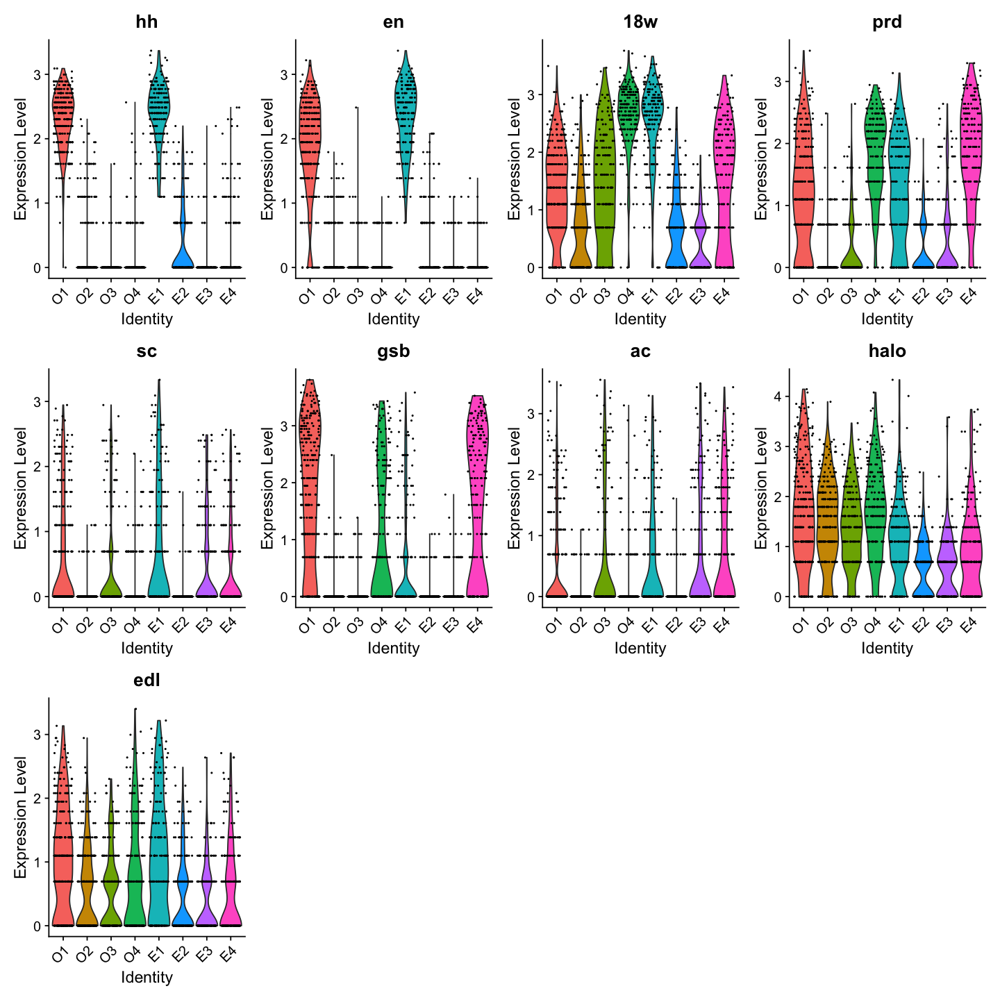

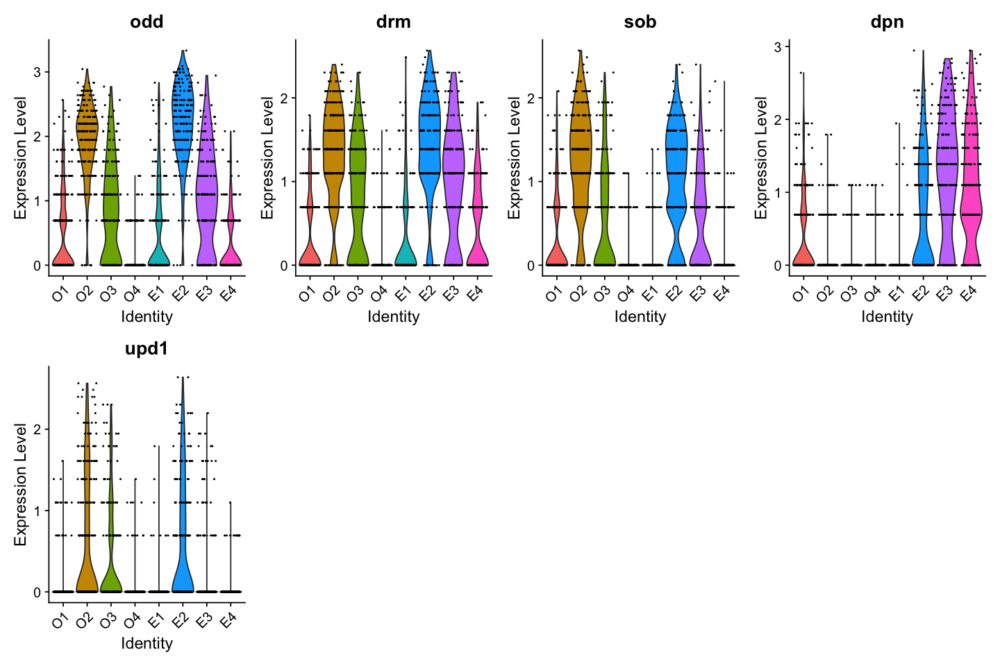

In [15]:
DE_E1vsE2 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "E1",
  ident.2 = "E2",
  logfc.threshold = log(2.0),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_E1vsE2_FWER0.01_FC2.0 <- filter(DE_E1vsE2, p_val_adj <= 0.01)

compaired_ID <- rep("E1vsE2", length=nrow(DE_E1vsE2_FWER0.01_FC2.0)) 
DE_E1vsE2_FWER0.01_FC2.0 <- cbind(DE_E1vsE2_FWER0.01_FC2.0, compaired_ID)
DE_E1vsE2_FWER0.01_FC2.0

DE_E1vsE2_FWER0.01_FC2.0_plus <- filter(DE_E1vsE2, p_val_adj <= 0.01 & avg_logFC >= log(2.0) )
DE_E1vsE2_FWER0.01_FC2.0_plus
dim(DE_E1vsE2_FWER0.01_FC2.0_plus)
DE_E1vsE2_FWER0.01_FC2.0_minus <- filter(DE_E1vsE2, p_val_adj <= 0.01 & avg_logFC <= -log(2.0) )
DE_E1vsE2_FWER0.01_FC2.0_minus
dim(DE_E1vsE2_FWER0.01_FC2.0_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_E1vsE2_FWER0.01_FC2.0_plus)/4))
"DEGs E1vsE2, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E1vsE2_FWER0.01_FC2.0_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_E1vsE2_plus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E1vsE2_FWER0.01_FC2.0_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_E1vsE2_FWER0.01_FC2.0_minus)/4))
"DEGs E1vsE2, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E1vsE2_FWER0.01_FC2.0_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_E1vsE2_minus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E1vsE2_FWER0.01_FC2.0_minus)/4))

write.table(DE_E1vsE2_FWER0.01_FC2.0, file = "./DEG_boundary_FC2.0/DEGs_E1vsE2_FWER0.01_FC2.0.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)


### E2 vs. E3


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
slp1,1.228222e-93,-1.9426847,0.542,1.000,2.456445e-90,E2vsE3
mid,7.014748e-87,1.7859648,0.990,0.397,1.402950e-83,E2vsE3
pxb,9.192165e-76,-1.4329256,0.635,1.000,1.838433e-72,E2vsE3
slp2,1.217936e-54,-1.1894225,0.059,0.763,2.435873e-51,E2vsE3
odd,6.249913e-46,1.0223651,0.980,0.742,1.249983e-42,E2vsE3
ftz,6.013020e-43,1.3818315,0.936,0.567,1.202604e-39,E2vsE3
sc,6.833786e-17,-0.7727841,0.039,0.356,1.366757e-13,E2vsE3
ac,1.727230e-15,-1.1959198,0.079,0.366,3.454459e-12,E2vsE3
Toll-6,9.769283e-10,-0.7607490,0.714,0.840,1.953857e-06,E2vsE3


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
mid,7.014748e-87,1.785965,0.990,0.397,1.402950e-83
odd,6.249913e-46,1.022365,0.980,0.742,1.249983e-42
ftz,6.013020e-43,1.381832,0.936,0.567,1.202604e-39


[1] 3 5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
slp1,1.228222e-93,-1.9426847,0.542,1.000,2.456445e-90
pxb,9.192165e-76,-1.4329256,0.635,1.000,1.838433e-72
slp2,1.217936e-54,-1.1894225,0.059,0.763,2.435873e-51
sc,6.833786e-17,-0.7727841,0.039,0.356,1.366757e-13
ac,1.727230e-15,-1.1959198,0.079,0.366,3.454459e-12
Toll-6,9.769283e-10,-0.7607490,0.714,0.840,1.953857e-06


[1] 6 5

[1] "DEGs E2vsE3, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs E2vsE3, avgFC <= -1.5, FWER <= 0.01"

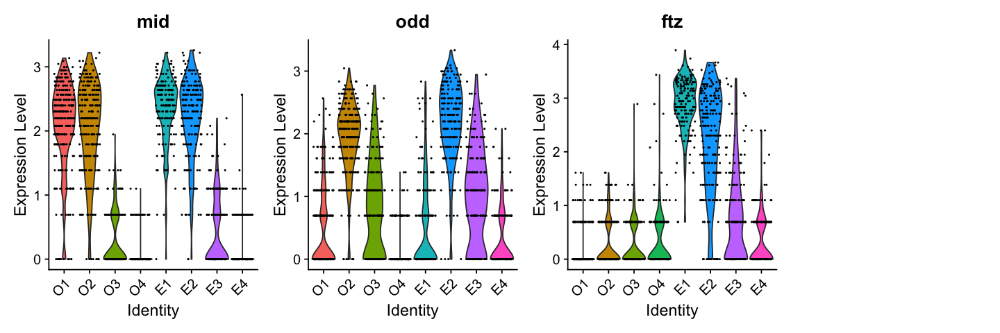

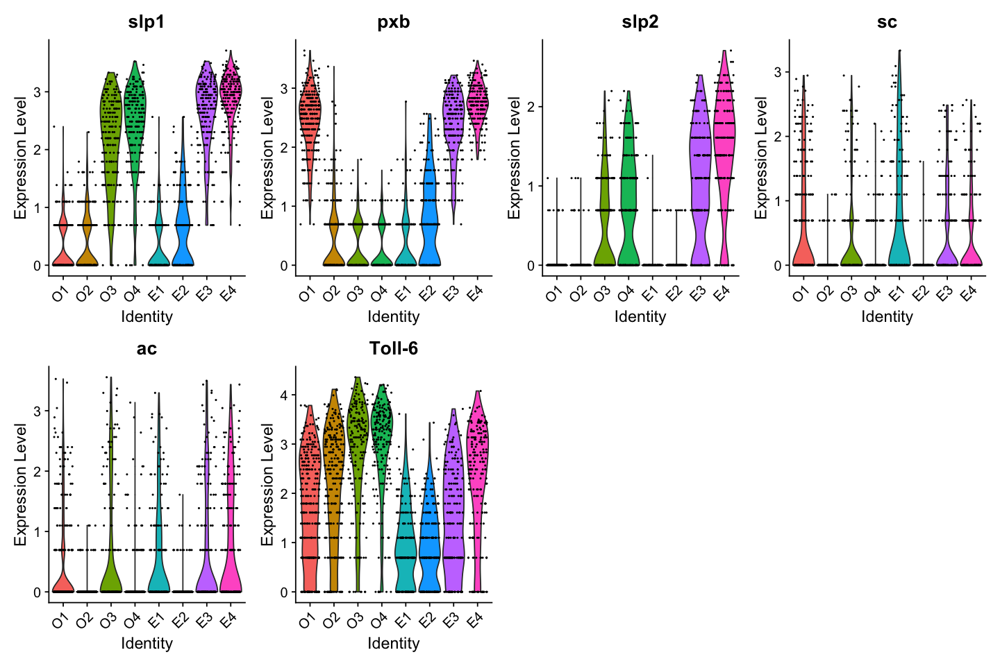

In [16]:
DE_E2vsE3 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "E2",
  ident.2 = "E3",
  logfc.threshold = log(2.0),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_E2vsE3_FWER0.01_FC2.0 <- filter(DE_E2vsE3, p_val_adj <= 0.01)

compaired_ID <- rep("E2vsE3", length=nrow(DE_E2vsE3_FWER0.01_FC2.0)) 
DE_E2vsE3_FWER0.01_FC2.0 <- cbind(DE_E2vsE3_FWER0.01_FC2.0, compaired_ID)
DE_E2vsE3_FWER0.01_FC2.0

DE_E2vsE3_FWER0.01_FC2.0_plus <- filter(DE_E2vsE3, p_val_adj <= 0.01 & avg_logFC >= log(2.0) )
DE_E2vsE3_FWER0.01_FC2.0_plus
dim(DE_E2vsE3_FWER0.01_FC2.0_plus)
DE_E2vsE3_FWER0.01_FC2.0_minus <- filter(DE_E2vsE3, p_val_adj <= 0.01 & avg_logFC <= -log(2.0) )
DE_E2vsE3_FWER0.01_FC2.0_minus
dim(DE_E2vsE3_FWER0.01_FC2.0_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_E2vsE3_FWER0.01_FC2.0_plus)/4))
"DEGs E2vsE3, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E2vsE3_FWER0.01_FC2.0_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_E2vsE3_plus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E2vsE3_FWER0.01_FC2.0_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_E2vsE3_FWER0.01_FC2.0_minus)/4))
"DEGs E2vsE3, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E2vsE3_FWER0.01_FC2.0_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_E2vsE3_minus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E2vsE3_FWER0.01_FC2.0_minus)/4))

write.table(DE_E2vsE3_FWER0.01_FC2.0, file = "./DEG_boundary_FC2.0/DEGs_E2vsE3_FWER0.01_FC2.0.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)

### E3 vs. E4


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
wg,7.993300e-82,-1.7587676,0.351,0.995,1.598660e-78,E3vsE4
prd,9.242521e-50,-1.3874514,0.361,0.941,1.848504e-46,E3vsE4
gsb,4.702035e-45,-2.0994310,0.113,0.691,9.404070e-42,E3vsE4
18w,1.804602e-34,-1.3666112,0.418,0.760,3.609205e-31,E3vsE4
odd,3.880188e-23,0.8930286,0.742,0.304,7.760377e-20,E3vsE4
ftz,1.535763e-08,0.7108732,0.567,0.353,3.071525e-05,E3vsE4


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
odd,3.880188e-23,0.8930286,0.742,0.304,7.760377e-20
ftz,1.535763e-08,0.7108732,0.567,0.353,3.071525e-05


[1] 2 5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
wg,7.993300e-82,-1.758768,0.351,0.995,1.598660e-78
prd,9.242521e-50,-1.387451,0.361,0.941,1.848504e-46
gsb,4.702035e-45,-2.099431,0.113,0.691,9.404070e-42
18w,1.804602e-34,-1.366611,0.418,0.760,3.609205e-31


[1] 4 5

[1] "DEGs E3vsE4, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs E3vsE4, avgFC <= -1.5, FWER <= 0.01"

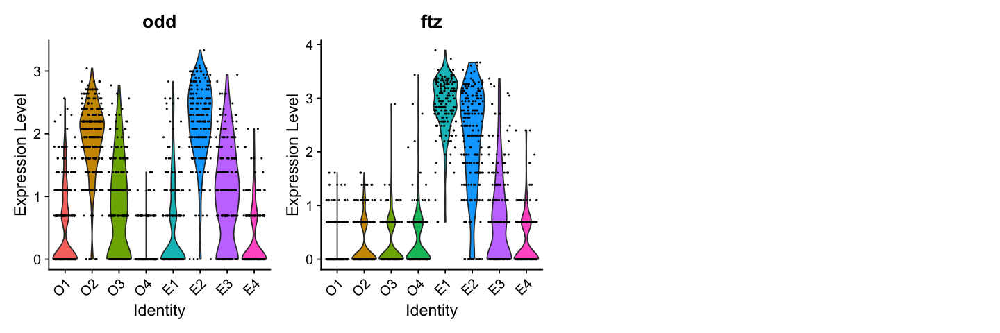

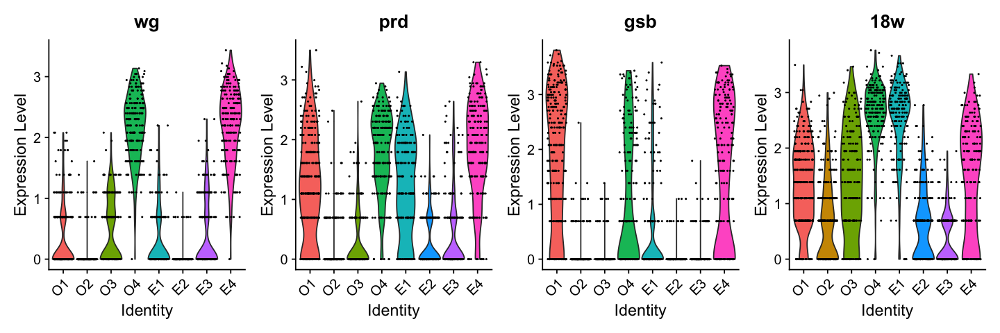

In [17]:
DE_E3vsE4 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "E3",
  ident.2 = "E4",
  logfc.threshold = log(2.0),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_E3vsE4_FWER0.01_FC2.0 <- filter(DE_E3vsE4, p_val_adj <= 0.01)

compaired_ID <- rep("E3vsE4", length=nrow(DE_E3vsE4_FWER0.01_FC2.0)) 
DE_E3vsE4_FWER0.01_FC2.0 <- cbind(DE_E3vsE4_FWER0.01_FC2.0, compaired_ID)
DE_E3vsE4_FWER0.01_FC2.0

DE_E3vsE4_FWER0.01_FC2.0_plus <- filter(DE_E3vsE4, p_val_adj <= 0.01 & avg_logFC >= log(2.0) )
DE_E3vsE4_FWER0.01_FC2.0_plus
dim(DE_E3vsE4_FWER0.01_FC2.0_plus)
DE_E3vsE4_FWER0.01_FC2.0_minus <- filter(DE_E3vsE4, p_val_adj <= 0.01 & avg_logFC <= -log(2.0) )
DE_E3vsE4_FWER0.01_FC2.0_minus
dim(DE_E3vsE4_FWER0.01_FC2.0_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_E3vsE4_FWER0.01_FC2.0_plus)/4))
"DEGs E3vsE4, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E3vsE4_FWER0.01_FC2.0_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_E3vsE4_plus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E3vsE4_FWER0.01_FC2.0_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_E3vsE4_FWER0.01_FC2.0_minus)/4))
"DEGs E3vsE4, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E3vsE4_FWER0.01_FC2.0_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_E3vsE4_minus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E3vsE4_FWER0.01_FC2.0_minus)/4))

write.table(DE_E3vsE4_FWER0.01_FC2.0, file = "./DEG_boundary_FC2.0/DEGs_E3vsE4_FWER0.01_FC2.0.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)

### E4 vs. O1


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


Done!



,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
slp1,7.052544e-172,2.5659038,1.000,0.330,1.410509e-168,E4vsO1
hh,1.470143e-121,-1.8634974,0.225,0.996,2.940287e-118,E4vsO1
ich,6.254373e-115,-2.4331218,0.230,0.954,1.250875e-111,E4vsO1
mid,2.403169e-114,-2.0161072,0.201,0.965,4.806339e-111,E4vsO1
wg,3.899779e-110,1.8814691,0.995,0.309,7.799558e-107,E4vsO1
trn,7.260556e-109,2.1663945,0.975,0.751,1.452111e-105,E4vsO1
en,7.134757e-108,-2.0030020,0.088,0.944,1.426951e-104,E4vsO1
eve,1.063456e-106,-2.1640382,0.328,0.989,2.126911e-103,E4vsO1
slp2,7.887463e-98,1.5967384,0.882,0.035,1.577493e-94,E4vsO1


,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
slp1,7.052544e-172,2.5659038,1.000,0.330,1.410509e-168
wg,3.899779e-110,1.8814691,0.995,0.309,7.799558e-107
trn,7.260556e-109,2.1663945,0.975,0.751,1.452111e-105
slp2,7.887463e-98,1.5967384,0.882,0.035,1.577493e-94
comm,1.007897e-84,1.6374827,0.951,0.253,2.015794e-81
run,1.322479e-84,1.7671281,0.941,0.302,2.644958e-81
comm2,5.618923e-66,1.1155854,0.794,0.084,1.123785e-62
dpn,2.256295e-27,0.8640247,0.789,0.340,4.512591e-24
Notum,5.642184e-23,0.7398343,0.426,0.074,1.128437e-19


[1] 13  5

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
hh,1.470143e-121,-1.8634974,0.225,0.996,2.940287e-118
ich,6.254373e-115,-2.4331218,0.230,0.954,1.250875e-111
mid,2.403169e-114,-2.0161072,0.201,0.965,4.806339e-111
en,7.134757e-108,-2.0030020,0.088,0.944,1.426951e-104
eve,1.063456e-106,-2.1640382,0.328,0.989,2.126911e-103
rdx,5.280862e-67,-0.8959824,0.995,1.000,1.056172e-63
Sema5c,2.938962e-27,-0.7642431,0.446,0.828,5.877924e-24
halo,5.401349e-16,-0.8333951,0.691,0.898,1.080270e-12
stg,8.494840e-11,-0.9258411,0.740,0.898,1.698968e-07


[1] 10  5

[1] "DEGs E4vsO1, avgFC >= 1.5, FWER <= 0.01"

[1] "DEGs E4vsO1, avgFC <= -1.5, FWER <= 0.01"

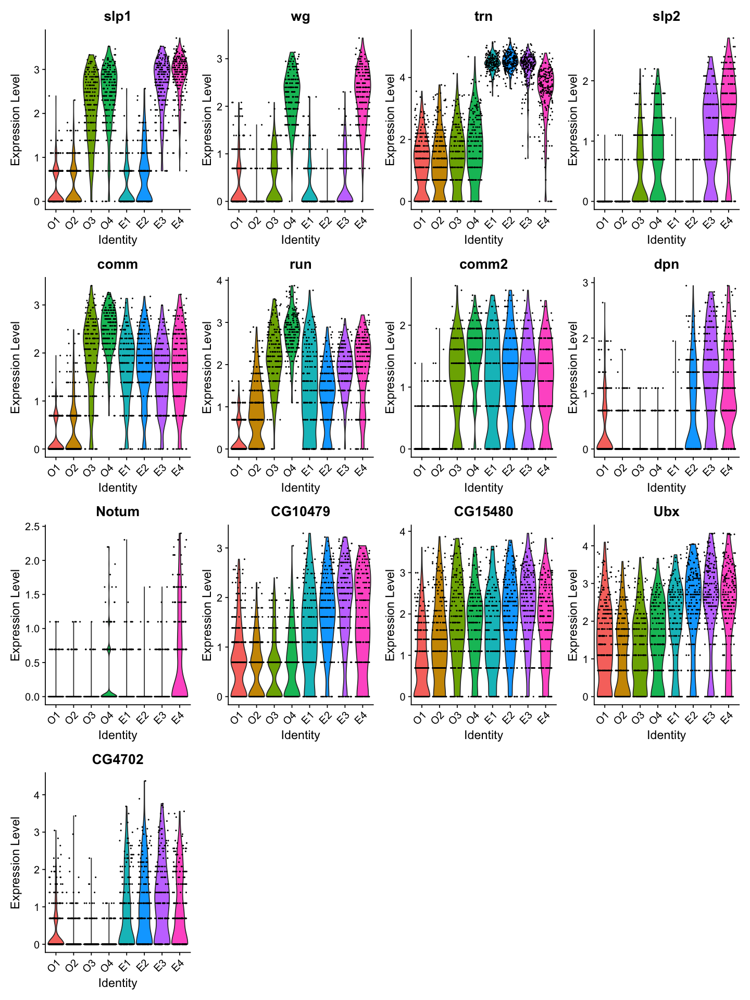

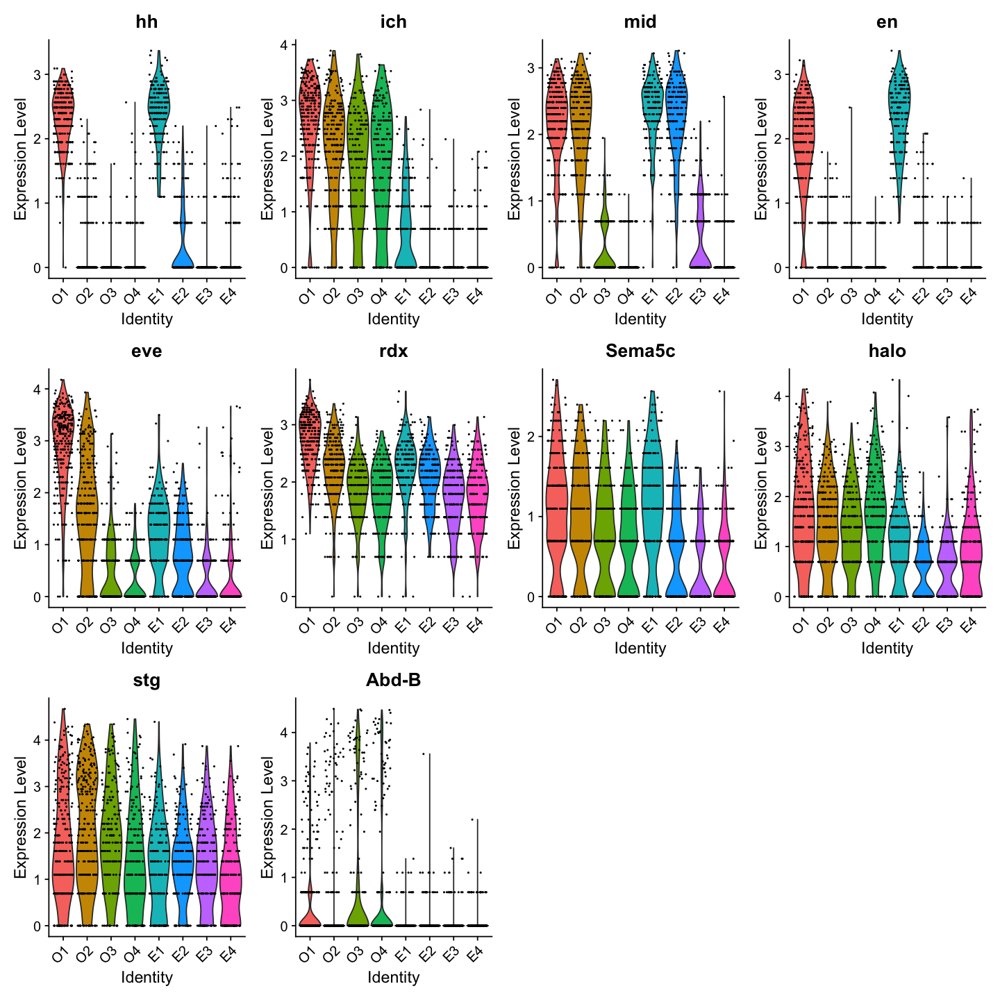

In [18]:
DE_E4vsO1 <- FindMarkers(
  seu_PR_VF3000,
  ident.1 = "E4",
  ident.2 = "O1",
  logfc.threshold = log(2.0),
  test.use = "MAST",
  verbose = TRUE,
  only.pos = FALSE,
)

DE_E4vsO1_FWER0.01_FC2.0 <- filter(DE_E4vsO1, p_val_adj <= 0.01)

compaired_ID <- rep("E4vsO1", length=nrow(DE_E4vsO1_FWER0.01_FC2.0)) 
DE_E4vsO1_FWER0.01_FC2.0 <- cbind(DE_E4vsO1_FWER0.01_FC2.0, compaired_ID)
DE_E4vsO1_FWER0.01_FC2.0

DE_E4vsO1_FWER0.01_FC2.0_plus <- filter(DE_E4vsO1, p_val_adj <= 0.01 & avg_logFC >= log(2.0) )
DE_E4vsO1_FWER0.01_FC2.0_plus
dim(DE_E4vsO1_FWER0.01_FC2.0_plus)
DE_E4vsO1_FWER0.01_FC2.0_minus <- filter(DE_E4vsO1, p_val_adj <= 0.01 & avg_logFC <= -log(2.0) )
DE_E4vsO1_FWER0.01_FC2.0_minus
dim(DE_E4vsO1_FWER0.01_FC2.0_minus)

options(repr.plot.width=12, repr.plot.height=　4*ceiling(nrow(DE_E4vsO1_FWER0.01_FC2.0_plus)/4))
"DEGs E4vsO1, avgFC >= 1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E4vsO1_FWER0.01_FC2.0_plus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_E4vsO1_plus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E4vsO1_FWER0.01_FC2.0_plus)/4))

options(repr.plot.width=12, repr.plot.height=4*ceiling(nrow(DE_E4vsO1_FWER0.01_FC2.0_minus)/4))
"DEGs E4vsO1, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = rownames(DE_E4vsO1_FWER0.01_FC2.0_minus), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_E4vsO1_minus_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(nrow(DE_E4vsO1_FWER0.01_FC2.0_minus)/4))

write.table(DE_E4vsO1_FWER0.01_FC2.0, file = "./DEG_boundary_FC2.0/DEGs_E4vsO1_FWER0.01_FC2.0.txt", 
            sep="\t", col.names=T, row.names=T, quote=F)

## Merge results

In [19]:
DE_O1vsO2_FWER0.01_FC2.0 <- DE_O1vsO2_FWER0.01_FC2.0 %>% rownames_to_column("gene_name")
DE_O2vsO3_FWER0.01_FC2.0 <- DE_O2vsO3_FWER0.01_FC2.0 %>% rownames_to_column("gene_name")
DE_O3vsO4_FWER0.01_FC2.0 <- DE_O3vsO4_FWER0.01_FC2.0 %>% rownames_to_column("gene_name")
DE_O4vsE1_FWER0.01_FC2.0 <- DE_O4vsE1_FWER0.01_FC2.0 %>% rownames_to_column("gene_name")
DE_E1vsE2_FWER0.01_FC2.0 <- DE_E1vsE2_FWER0.01_FC2.0 %>% rownames_to_column("gene_name")
DE_E2vsE3_FWER0.01_FC2.0 <- DE_E2vsE3_FWER0.01_FC2.0 %>% rownames_to_column("gene_name")
DE_E3vsE4_FWER0.01_FC2.0 <- DE_E3vsE4_FWER0.01_FC2.0 %>% rownames_to_column("gene_name")
DE_E4vsO1_FWER0.01_FC2.0 <- DE_E4vsO1_FWER0.01_FC2.0 %>% rownames_to_column("gene_name")
DE_all_FWER0.01_FC2.0 <- rbind(DE_O1vsO2_FWER0.01_FC2.0, DE_O2vsO3_FWER0.01_FC2.0, DE_O3vsO4_FWER0.01_FC2.0, 
                              DE_O4vsE1_FWER0.01_FC2.0, DE_E1vsE2_FWER0.01_FC2.0, DE_E2vsE3_FWER0.01_FC2.0,
                             DE_E3vsE4_FWER0.01_FC2.0, DE_E4vsO1_FWER0.01_FC2.0)

In [20]:
DE_all_FWER0.01_FC2.0

gene_name,p_val,avg_logFC,pct.1,pct.2,p_val_adj,compaired_ID
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
pxb,8.620496e-140,1.8718022,1.000,0.402,1.724099e-136,O1vsO2
hh,2.761928e-139,1.9208552,0.996,0.203,5.523855e-136,O1vsO2
en,1.697168e-109,1.8206127,0.944,0.199,3.394336e-106,O1vsO2
odd,2.871062e-95,-1.3606561,0.411,0.973,5.742124e-92,O1vsO2
gsb,2.603967e-77,2.2400056,0.814,0.123,5.207934e-74,O1vsO2
drm,1.004479e-68,-1.0551370,0.309,0.916,2.008959e-65,O1vsO2
sob,2.139033e-58,-0.9805319,0.298,0.889,4.278066e-55,O1vsO2
prd,1.411991e-49,1.2843001,0.775,0.226,2.823983e-46,O1vsO2
eve,1.744020e-42,0.9048521,0.989,0.835,3.488039e-39,O1vsO2


In [21]:
table(DE_all_FWER0.01_FC2.0$compaired_ID)


E1vsE2 E2vsE3 E3vsE4 E4vsO1 O1vsO2 O2vsO3 O3vsO4 O4vsE1 
    14      9      6     23     15     14      7     19 

In [22]:
length(unique(DE_all_FWER0.01_FC2.0$gene_name))

[1] 43

In [23]:
write.table(DE_all_FWER0.01_FC2.0, file = "./DEG_boundary_FC2.0/DEGs_all_FWER0.01_FC2.0.txt", 
            sep="\t", col.names=T, row.names=F, quote=F)

In [24]:
write(unique(DE_all_FWER0.01_FC2.0$gene_name), file = "./DEG_boundary_FC2.0/unique_DEGs_list_FWER0.01_FC2.0.txt" )

[1] "DEGs all unique, avgFC <= -1.5, FWER <= 0.01"

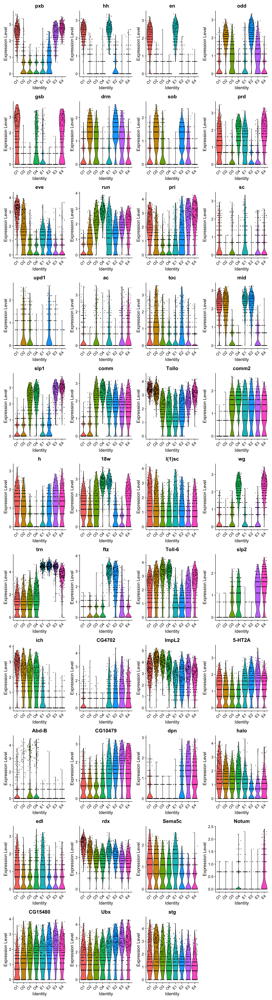

In [25]:
options(repr.plot.width=12, repr.plot.height=4*ceiling(length(unique(DE_all_FWER0.01_FC2.0$gene_name))/4))
"DEGs all unique, avgFC <= -1.5, FWER <= 0.01"
VlnPlot(seu_PR_VF3000, features = unique(DE_all_FWER0.01_FC2.0$gene_name), pt.size = 0.2, ncol = 4) 
ggsave(file = "./DEG_boundary_FC2.0/DEGs_unique_all_FC2.0.png", 
       width = 10.24, height = 2.56*ceiling(length(unique(DE_all_FWER0.01_FC2.0$gene_name))/4), limitsize = FALSE)

In [26]:
unique(DE_all_FWER0.01_FC2.0$gene_name)

[1] "pxb"     "hh"      "en"      "odd"     "gsb"     "drm"     "sob"    
 [8] "prd"     "eve"     "run"     "pri"     "sc"      "upd1"    "ac"     
[15] "toc"     "mid"     "slp1"    "comm"    "Tollo"   "comm2"   "h"      
[22] "18w"     "l(1)sc"  "wg"      "trn"     "ftz"     "Toll-6"  "slp2"   
[29] "ich"     "CG4702"  "ImpL2"   "5-HT2A"  "Abd-B"   "CG10479" "dpn"    
[36] "halo"    "edl"     "rdx"     "Sema5c"  "Notum"   "CG15480" "Ubx"    
[43] "stg"

In [27]:
options(repr.plot.width=3, repr.plot.height=4)
for (i in unique(DE_all_FWER0.01_FC2.0$gene_name)){
plot <- VlnPlot(seu_PR_VF3000, features = paste(i), pt.size = 0.2, ncol = 1)  + 
scale_fill_manual(values = c("skyblue1", "skyblue2", "skyblue3", "skyblue4", "magenta1", "magenta2", "magenta3", "magenta4")) +
NoLegend()
ggsave(filename=paste("./DEG_boundary_FC2.0/unique_plot/DEGs_unique_all_FC2.0_",i,".png", sep=""), 
       width = 3.84, height = 5.12, limitsize = FALSE)
}



In [28]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] MAST_1.16.0                 SingleCellExperiment_1.12.0
 [3] SummarizedExperiment_1.20.0 Biobase_2.50.0             
 [5] GenomicRanges_1.42.0        GenomeInfoDb_1.26.2        
 [7] IRanges_2.24.1              S4Vectors_0.28.1           
 [9] BiocGenerics_0.36.0         MatrixGenerics_1.2.0       
[11] matrixStats_0.57.0          tibble_3.0.5               
[13] dplyr_1.0.3                 Matrix_1.3-2               
[15] data.table_1.13.6           magrittr_2.0.1